In [1]:
using Flux, MLDatasets, ImageCore, StatsBase
using MLDatasets: MNIST
using Flux: train!, update!
using Flux: onehot, throttle, crossentropy, relu, sigmoid
using StatsBase: sample

In [2]:
using Plots
using Clustering
using JLD
using LinearAlgebra
using Random

In [152]:
using Flux
using Flux: Data.DataLoader
using Flux: onehotbatch, onecold, crossentropy
using Flux: @epochs
using Statistics
using MLDatasets

# load full training set
train_x, train_y = MNIST.traindata();

train_x_vec = [vec(train_x[:, :, i]) for i = 1:60000];
train_y_hot = [onehot(train_y[i], 0:9) for i = 1:60000];

# load full test set
test_x,  test_y  = MNIST.testdata();

test_x_vec = [vec(test_x[:, :, i]) for i = 1:10000];
test_y_hot = [onehot(test_y[i], 0:9) for i = 1:10000];

traindata = [(train_x_vec[i], train_y_hot[i]) for i = 1:60000];
testdata = [(test_x_vec[i], test_y_hot[i]) for i = 1:10000];

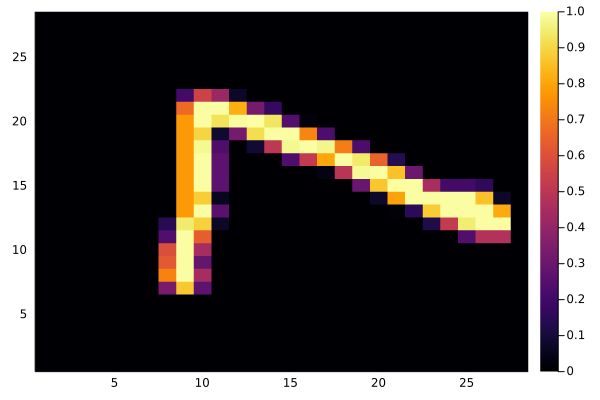

In [153]:
gr()
heatmap(test_x[:, :, 1])

In [155]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct LinearSubspaceModel
    model::Any # maybe change this type to Array{Any}
    num_models::Int64
    reparams::Matrix{Float64}
    A::Matrix{Float64}
end

function LinearSubspaceModel(
        model::Any,
        num_models::Int64,
        model_variance::Float64,
        reparam_variance::Float64,
        num_params::Int64,
        num_reparams::Int64
    )
    A = reparam_variance*randn((num_params, num_reparams))

    reparams = model_variance*(randn(num_models, num_reparams));

    return LinearSubspaceModel(model, num_models, reparams, A)
end

function LinearSubspaceModel(
        model::Any,
        num_models::Int64,
        model_variance::Float64,
        family_variance::Float64,
        num_params::Int64,
        num_reparams::Int64,
        A::Matrix{Float64}
    )
    reparams = model_variance*(randn(num_models, num_reparams));

    return LinearSubspaceModel(model, num_models, reparams, A)
end


# Overload call, so the object can be used as a function
function (m::LinearSubspaceModel)(x)
    model_id = rand(1:m.num_models)
    
    p, restruct = Flux.destructure(m.model)

    reparam_model = restruct(m.A*m.reparams[model_id, :])
    return reparam_model(x)
end

In [156]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct ReparamModel
    model::Any # maybe change this type to Array{Any}
    reparam::Vector{Float64}
    A::Matrix{Float64}
end


# Overload call, so the object can be used as a function
function (m::ReparamModel)(x)
    p, restruct = Flux.destructure(m.model)

    reparam_model = restruct(m.A*m.reparam)
    return reparam_model(x)
end

In [261]:
input_size = 784;
output_size = 16;

In [268]:
# The prototype model to be used in the LinearSubspaceModel
model = Chain(
    Dense(input_size, output_size, relu),
    Dense(output_size, 10),
    softmax
)
p, re = Flux.destructure(model)
size(p)[1]

12730

In [269]:
# Set all of the parameters necessary to generate a LinearSubspaceModel

# This is the number of parameters to sample from the subspace
num_models = 1000

# This is the variance of the parameters sampled from a normal distribution
# with mean zero in the subspace
model_variance = 1/5

# This is the variance of the initialization of the reparameterization
reparam_variance = 0.001

# This is the total number of parameters in the model prototype we have chosen
num_params = size(p)[1]

# This is the dimensionality of the subspace/the number of parameters
# in the reparameterized model
num_reparams = 2

2

In [270]:
# Allows loading of reparameterization matrices that were saved from previous runs
#A = load("32_parameter_invariant_model_1_hidden_32_nodes.jld")["A"]

In [271]:
subspace_model = LinearSubspaceModel(model, num_models, model_variance, reparam_variance, num_params, num_reparams)

# This is the call you would use with your previously loaded reparameterization matrix (A)
#subspace_model = LinearSubspaceModel(model, num_models, model_variance, family_variance, num_params, num_reparams, A)

LinearSubspaceModel(Chain(Dense(784, 16, relu), Dense(16, 10), softmax), 100000, [0.04668582717076827 -0.06102482550964782; 0.43602864393850504 0.1767401363133159; … ; 0.07772454227457248 0.0008775341486809721; 0.11741380297728594 -0.1107945398691147], [0.0015912146903661532 0.0002985152174951149; 0.000908269884950399 0.00031847186056235246; … ; -4.5405862305417713e-5 -0.00040316655608749343; -0.0015387171254538608 -0.0004626870084426611])

In [272]:
# This sets which parameters are trainable. We do not want Flux to train the
# parameters in the actual model, only the reparameterization matrix.
Flux.trainable(subspace_model::LinearSubspaceModel) = (subspace_model.A, )
Flux.params(subspace_model)

Params([[0.0015912146903661532 0.0002985152174951149; 0.000908269884950399 0.00031847186056235246; … ; -4.5405862305417713e-5 -0.00040316655608749343; -0.0015387171254538608 -0.0004626870084426611]])

In [273]:
# Set which model to use. This can be set to just "model"
# to test how well the model performs when its parameters are trained themselves.
data_model = subspace_model

LinearSubspaceModel(Chain(Dense(784, 16, relu), Dense(16, 10), softmax), 100000, [0.04668582717076827 -0.06102482550964782; 0.43602864393850504 0.1767401363133159; … ; 0.07772454227457248 0.0008775341486809721; 0.11741380297728594 -0.1107945398691147], [0.0015912146903661532 0.0002985152174951149; 0.000908269884950399 0.00031847186056235246; … ; -4.5405862305417713e-5 -0.00040316655608749343; -0.0015387171254538608 -0.0004626870084426611])

In [274]:
# Choose how many samples of the parameters should be taken with num
# This should probably be somewhere between sqrt(num_reparams)
function loss(x, y)
    loss = 0
    num = 2
    for i = 1:num
        loss += Flux.Losses.crossentropy(data_model(x), y)
    end
    return loss/num
end
accuracy(x, y) = mean(onecold.(x) .== onecold.(y))

accuracy (generic function with 1 method)

In [275]:
#loss(x, y) = Flux.Losses.crossentropy(data_model(x), y)
opt = ADAM(.001)
ps = Flux.params(data_model)

num_runs = 1
for j in 1:num_runs
    trainsample = sample(traindata, 300, replace=false);

    epochs = 400
    for epoch in 1:epochs
        loss_total = 0
        train = shuffle(trainsample)
        for (i, d) in enumerate(train)

            # TODO
            # Choose small random sub sample from n sample above and provide to the loss function
            gs = gradient(ps) do
              training_loss = loss(d...)
              # Code inserted here will be differentiated, unless you need that gradient information
              # it is better to do the work outside this block.
              return training_loss
            end
            loss_total += loss(d...)
            if i%100==0
                println(loss_total/i)
            end
            # Insert whatever code you want here that needs training_loss, e.g. logging.
            # logging_callback(training_loss)
            # Insert what ever code you want here that needs gradient.
            # E.g. logging with TensorBoardLogger.jl as histogram so you can see if it is becoming huge.
            update!(opt, ps, gs)
        end
        println(epoch)
    end
    print("NUMBER OF RUNS: ")
    println(j)
end

2.3023399612801154
2.3011389429921603
2.297931367407116
1
2.2841981232507753
2.2799007418121344
2.267646924366185
2
2.1956765093504327
2.1772658796392634
2.172594371311494
3
2.1181675534131963
2.120118359447338
2.0972613297900025
4
2.017158292915921
2.0266871130799635
2.008046744303332
5
1.9152415823584876
1.9321410291871681
1.9340609389889107
6
1.903789646396846
1.8945445073062237
1.8849059523470784
7
1.8531623591782234
1.8307407727626086
1.8359816798116118
8
1.84847599157677
1.8833021540091477
1.8293311036742255
9
1.729717425489567
1.7708863582059273
1.7809127397394136
10
1.7223850936765543
1.7561974981382407
1.6979599597204156
11
1.702001000856622
1.6867834762290883
1.6735053667084283
12
1.6882145146198235
1.612279664279553
1.5920319681459132
13
1.6206864527911484
1.5344355241624499
1.5696958446082194
14
1.6271426077182645
1.5847225179085394
1.555388253071049
15
1.4887064083430166
1.4913631640147387
1.4486403575944347
16
1.4913204386653174
1.510660006116219
1.4744268596192136
17
1.4

0.37283744642875083
0.3402176453831059
137
0.2856467989777765
0.28029666553960036
0.269370772472494
138
0.3017605971432231
0.30452920706097153
0.29911054275630256
139
0.311442478801935
0.3053894747813602
0.30457598543310394
140
0.3956297248284202
0.3600396070991718
0.32968807905362346
141
0.2882701044839159
0.28897380905163284
0.2910656630817811
142
0.24578465276486722
0.25833010708551796
0.27422508070417934
143
0.38367789292742643
0.3366475668745745
0.31743010761567303
144
0.27421263892643744
0.26850717846904704
0.296221047310662
145
0.28055557231907113
0.30017316233067926
0.2908943160576564
146
0.28745855837519646
0.29886692922862584
0.3024630442877267
147
0.2209075863322921
0.21170788355105635
0.23987303508447042
148
0.2606382421813406
0.28138142231721197
0.28046421414520023
149
0.25459761356723754
0.27182055361365154
0.271518112724889
150
0.2746441996514959
0.23570934198595478
0.2382353457186638
151
0.2679183736509425
0.2703976917630558
0.2679617230884048
152
0.2627715377910117
0.2

0.1086192772908889
0.12125465720627814
267
0.15461394918406826
0.14778314364867912
0.12994250934848572
268
0.12754385368524956
0.11303098481752821
0.11889427020541556
269
0.10820553809140575
0.08607158421646727
0.09677854160979778
270
0.08740884008096998
0.09014582240337644
0.10064057616001934
271
0.09120541590314823
0.0916391393325418
0.08925682773976037
272
0.0945971739498837
0.08677447391722934
0.10127417941678572
273
0.0990755376780359
0.0992480628949861
0.10388019015891173
274
0.13603304827933582
0.11531632243985773
0.10350518540762775
275
0.09984645988737961
0.09411179021076438
0.10059318193461093
276
0.06451979479586593
0.10791570532086718
0.10299937698944792
277
0.12693054615458468
0.11897354976825195
0.11455685004454258
278
0.05254872626096903
0.07214252338391539
0.08716258181554382
279
0.1034339885994639
0.09675163338364866
0.10052770001486194
280
0.07614555625774379
0.08624093415697386
0.08770918679978594
281
0.05879708911873501
0.08801468486847583
0.08496600882576949
282
0.

LoadError: InterruptException:

In [322]:
#save("32_parameter_invariant_model_1_hidden_32_nodes.jld", "A", data_model.A)

ACCURACY: 0.7891


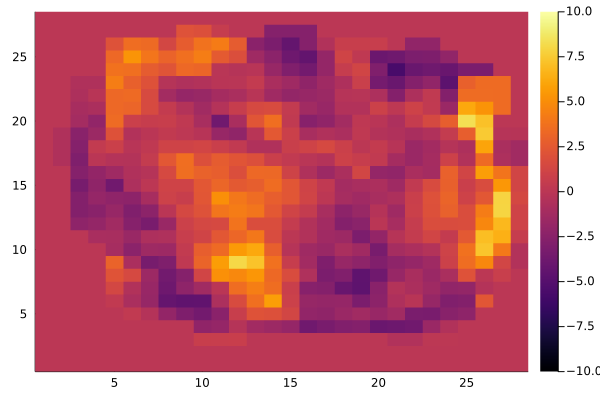

In [295]:
p, restruct = Flux.destructure(data_model.model)
reparams = 1*randn(num_reparams)
#reparams = zeros(num_reparams)
#reparams[2] = 1
#reparams = .01*ones(num_reparams)
testing_model = restruct(subspace_model.A*reparams)
print("ACCURACY: ")
println(accuracy(testing_model.(test_x_vec), test_y_hot))
testing_ps = Flux.params(testing_model);
ps = testing_ps;
gr()
heatmap(reshape(ps[1][2, :], (28, 28)), clim=(-10, 10),)

In [256]:
p, restruct = Flux.destructure(data_model.model)
reparams = zeros(num_reparams)
hidden_A = zeros((input_size*output_size, num_reparams))
for i = 1:num_reparams
    reparams[i] = 1
    testing_model = restruct(subspace_model.A*reparams)
    p_layer, restruct = Flux.destructure(testing_model[1])
    hidden_A[:, i] = p_layer
end
    

In [257]:
hidden_A

12544×128 Matrix{Float64}:
  4.34239e-5   -0.00155781   -0.00204469   …  -0.0147296   -0.0142897
 -0.000624293  -0.000559926   0.000249644      0.026996     0.0251258
  0.00179404    0.00147112   -0.000369193     -0.0174331   -0.0182136
 -0.000307072  -0.0012668    -0.0023494        0.0271038    0.0266332
  0.00038256   -0.000502466  -0.000591576     -0.0019932   -0.000385712
  0.001263      0.00167771    0.00018815   …   0.00152713   0.00180631
 -0.000801904  -0.0014569    -8.13706e-5      -0.00487555  -0.0044269
  0.000551791   0.00137789    0.00344299      -0.0144255   -0.0137497
 -0.00111913   -0.00201172   -0.00108297      -0.026382    -0.026811
  0.00054619    0.000268888   0.00017513       0.00179553   0.00112212
  0.000437737  -0.000261996  -8.76054e-6   …  -0.00658898  -0.00788652
  9.30325e-5    0.000415429   0.00117645       0.00426572   0.00368662
 -0.000196315  -0.00168715   -0.00277123       0.0130828    0.0150033
  ⋮                                        ⋱              

In [302]:
Plots.plot(subspace_model.A[:, 1], subspace_model.A[:, 2], seriestype = :scatter)

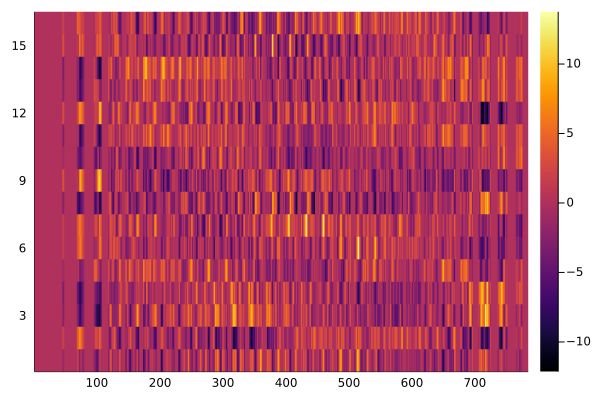

In [282]:
gr()
heatmap(ps[1])

In [162]:
sum(subspace_model.A .< .00001)

LoadError: MethodError: objects of type Int64 are not callable

In [114]:
vec_set = ps[1]
y_size = size(vec_set)[1]
start = 1
print(y_size)
distance_matrix = zeros((y_size, y_size))
for i = start:start+y_size-1
    println(i)
    for j = start:start+y_size-1
        ith = vec_set[i - start + 1, :]
        jth = vec_set[j - start + 1, :]
        distance_matrix[i - start + 1, j - start + 1] = exp(-dot(ith, jth)/(norm(ith .+ .0001)*norm(jth .+ .0001))) - exp(-1)
    end
end

321
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32


In [115]:
clust_y = hclust(distance_matrix)

Hclust{Float64}([-25 -28; -27 1; … ; -3 29; -4 30], [0.06456864617404162, 0.08574784016869158, 0.10259534264408976, 0.11191334967139938, 0.11827003715478196, 0.11865515052094577, 0.12167359990306487, 0.1224874409908458, 0.13262241200393898, 0.13420578778893233  …  0.20900767686031896, 0.22981945631238554, 0.23139555472224604, 0.23247670007922971, 0.23590468869806525, 0.24121744275015866, 0.2470396722287833, 0.24913945997188225, 0.2678157038554905, 0.29993691102354814], [4, 3, 18, 31, 21, 13, 11, 26, 1, 22  …  16, 14, 5, 19, 6, 8, 30, 10, 24, 29], :single)

In [296]:
# Visualize a 2 parameter reparameterization on the plane.
# Cluster the parameters, even in higher dimensions (maybe IsoMap for dimensionality reduction)
# Could the number of clusters represent the minimal necessary parameters?
vec_set = subspace_model.A
x_size = input_size*output_size#size(vec_set)[1]
gramian = zeros((x_size, x_size))
@Threads.threads for i = 1:x_size
    println(i)
    for j = 1:x_size
        ith = vec_set[i, :]
        jth = vec_set[j, :]
        gramian[i, j] = sqrt(sum((ith-jth).^2))#dot(ith, jth)/(norm(ith)*norm(jth))
    end
end

2092
10455
8365
1
6274
4183
2
3
8366
10456
4184
6275
2093
4
5
8367
4185
10457
6
6276
2094
7
8368
10458
4186
6277
2095
8
10459
8369
4187
9
6278
2096
10
11
12
10460
4188
8370
2097
6279
13
4189
10461
8371
2098
6280
14
4190
10462
8372
2099
6281
15
4191
10463
8373
16
2100
6282
17
18
4192
10464
8374
2101
19
6283
10465
8375
20
4193
2102
6284
21
4194
8376
10466
2103
6285
22
4195
10467
8377
2104
6286
23
4196
10468
8378
24
2105
6287
25
2106
10469
4197
8379
6288
26
8380
2107
4198
10470
6289
27
8381
4199
2108
10471
6290
28
4200
2109
8382
10472
6291
29
30
4201
10473
8383
2110
6292
31
2111
10474
6293
8384
4202
32
10475
2112
8385
6294
4203
33
2113
10476
8386
6295
4204
34
2114
10477
8387
4205
6296
35
10478
2115
6297
8388
4206
36
10479
2116
4207
37
6298
8389
4208
10480
6299
38
8390
2117
4209
39
10481
8391
6300
2118
40
4210
10482
8392
6301
2119
41
4211
8393
10483
6302
2120
42
4212
8394
10484
6303
2121
43
6304
10485
4213
8395
2122
44
6305
10486
8396
2123
4214
45
8397
6306
10487
2124
4215
46
8398
6307
104

LoadError: TaskFailedException

[91m    nested task error: [39mInterruptException:
    Stacktrace:
      [1] [0m[1mArray[22m
    [90m    @ [39m[90m./[39m[90;4mboot.jl:448[0m[90m [inlined][39m
      [2] [0m[1mArray[22m
    [90m    @ [39m[90m./[39m[90;4mboot.jl:457[0m[90m [inlined][39m
      [3] [0m[1mArray[22m
    [90m    @ [39m[90m./[39m[90;4mboot.jl:465[0m[90m [inlined][39m
      [4] [0m[1msimilar[22m
    [90m    @ [39m[90m./[39m[90;4mabstractarray.jl:785[0m[90m [inlined][39m
      [5] [0m[1msimilar[22m
    [90m    @ [39m[90m./[39m[90;4mabstractarray.jl:784[0m[90m [inlined][39m
      [6] [0m[1msimilar[22m
    [90m    @ [39m[90m./[39m[90;4mbroadcast.jl:197[0m[90m [inlined][39m
      [7] [0m[1msimilar[22m
    [90m    @ [39m[90m./[39m[90;4mbroadcast.jl:196[0m[90m [inlined][39m
      [8] [0m[1mcopy[22m
    [90m    @ [39m[90m./[39m[90;4mbroadcast.jl:908[0m[90m [inlined][39m
      [9] [0m[1mmaterialize[22m[0m[1m([22m[90mbc[39m::[0mBase.Broadcast.Broadcasted[90m{Base.Broadcast.DefaultArrayStyle{1}, Nothing, typeof(Base.literal_pow), Tuple{Base.RefValue{typeof(^)}, Vector{Float64}, Base.RefValue{Val{2}}}}[39m[0m[1m)[22m
    [90m    @ [39m[90mBase.Broadcast[39m [90m./[39m[90;4mbroadcast.jl:883[0m
     [10] [0m[1mmacro expansion[22m
    [90m    @ [39m[90m./[39m[90;4mIn[296]:12[0m[90m [inlined][39m
     [11] [0m[1m(::var"#1015#threadsfor_fun#54"{UnitRange{Int64}})[22m[0m[1m([22m[90monethread[39m::[0mBool[0m[1m)[22m
    [90m    @ [39m[35mMain[39m [90m./[39m[90;4mthreadingconstructs.jl:81[0m
     [12] [0m[1m(::var"#1015#threadsfor_fun#54"{UnitRange{Int64}})[22m[0m[1m([22m[0m[1m)[22m
    [90m    @ [39m[35mMain[39m [90m./[39m[90;4mthreadingconstructs.jl:48[0m

4388
6478
10661
2298
4389
8571
6479
10662
2299
4390
8572
6480
10663
2300
4391
8573
10664
6481
2301
8574
4392
2302
6482
10665
4393
8575
10666
2303
6483
4394
8576
10667
6484
2304
8577
4395
2305
10668
6485
8578
4396
6486
10669
2306
8579
4397
6487
2307
10670
4398
8580
6488
10671
2308
4399
8581
6489
2309
10672
4400
8582
6490
2310
8583
10673
4401
8584
4402
6491
2311
10674
4403
6492
10675
2312
8585
6493
2313
4404
10676
8586
6494
4405
2314
10677
8587
4406
6495
2315
10678
8588
10679
2316
8589
4407
6496
10680
4408
2317
8590
6497
10681
4409
2318
8591
6498
2319
10682
4410
8592
6499
2320
4411
8593
10683
6500
8594
4412
2321
10684
6501
8595
4413
2322
10685
6502
2323
6503
10686
8596
4414
2324
6504
8597
10687
4415
10688
4416
2325
8598
6505
10689
8599
2326
4417
6506
10690
8600
4418
2327
6507
8601
4419
2328
10691
6508
8602
4420
10692
2329
6509
8603
10693
4421
2330
6510
4422
2331
8604
10694
6511
2332
4423
10695
8605
6512
2333
4424
8606
10696
6513
2334
4425
8607
10697
6514
8608
2335
10698
4426
6515
2336
86

6794
10977
8887
4706
2614
8888
10978
6795
4707
2615
10979
6796
8889
4708
2616
8890
6797
10980
4709
2617
6798
8891
10981
4710
2618
8892
10982
6799
4711
2619
6800
8893
10983
4712
2620
8894
10984
6801
4713
2621
6802
10985
8895
4714
2622
6803
8896
10986
4715
2623
6804
8897
10987
4716
2624
6805
8898
10988
4717
2625
6806
8899
10989
4718
2626
6807
8900
10990
4719
2627
10991
8901
6808
4720
2628
10992
8902
6809
4721
2629
8903
6810
10993
4722
2630
8904
6811
10994
4723
2631
6812
8905
10995
4724
2632
10996
6813
8906
4725
2633
6814
10997
8907
4726
2634
8908
10998
6815
4727
2635
6816
10999
8909
4728
2636
6817
11000
8910
4729
2637
6818
11001
8911
4730
2638
6819
11002
8912
4731
2639
6820
11003
8913
2640
4732
6821
11004
8914
4733
2641
6822
11005
8915
4734
2642
6823
11006
8916
2643
4735
6824
11007
8917
2644
4736
6825
11008
8918
4737
2645
6826
11009
8919
4738
2646
6827
11010
8920
2647
4739
6828
11011
8921
4740
2648
6829
8922
11012
4741
2649
6830
8923
11013
2650
4742
6831
11014
8924
2651
4743
6832
11015
8

In [197]:
#save("2_parameter_gramian.jld", "gramian", gramian)
#save("2_parameter_gramian.jld", "model", data_model)

In [252]:
abs_gramian = abs.(gramian)

12544×12544 Matrix{Float64}:
 0.0         0.00332819  0.00326236  …  0.0035013   0.0037595   0.00559355
 0.00332819  0.0         0.0041301      0.0026618   0.00301747  0.00471539
 0.00326236  0.0041301   0.0            0.00463009  0.00387671  0.0049203
 0.00215216  0.00416138  0.00429104     0.00345407  0.00455496  0.00640449
 0.00236393  0.00394942  0.00233344     0.00410202  0.00458046  0.0042674
 0.00330881  0.00309534  0.00293862  …  0.00303062  0.00446005  0.00444374
 0.00247666  0.00355866  0.00370519     0.00405866  0.00455753  0.00579746
 0.00362148  0.00338978  0.00378309     0.00464545  0.00298609  0.00545969
 0.00263635  0.00417372  0.0034691      0.00475178  0.00469929  0.00541231
 0.00330077  0.0037095   0.00376362     0.00430356  0.00516135  0.0055551
 0.00221166  0.00430045  0.00428135  …  0.00365382  0.00434366  0.00662938
 0.00431218  0.00422709  0.00564026     0.00370899  0.00378808  0.0060326
 0.00387997  0.00328412  0.00348439     0.00302342  0.00391178  0.00528867


In [253]:
mean(abs_gramian)

0.9494398674046882

In [260]:
length(abs_gramian[abs_gramian .< 1])/length(gramian)

0.5461383201538746

In [186]:
gr()
heatmap(gramian, c=:bluesreds)

InterruptException: InterruptException:

In [118]:
print(det(gramian))

9.017422739436896e27

In [751]:
clust_x = hclust(distance_matrix)

LoadError: ArgumentError: Distance matrix should be symmetric.

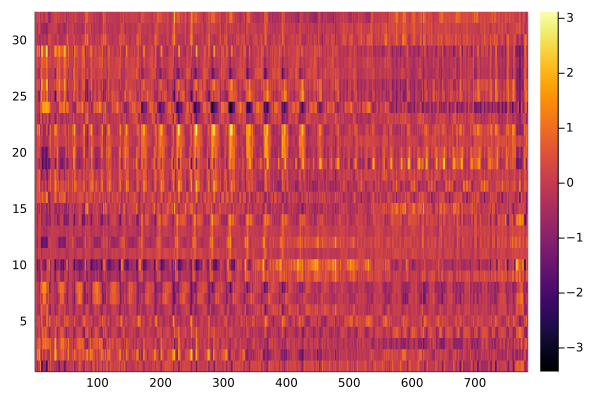

In [119]:
gr()
heatmap(ps[1][clust_y.order, :])

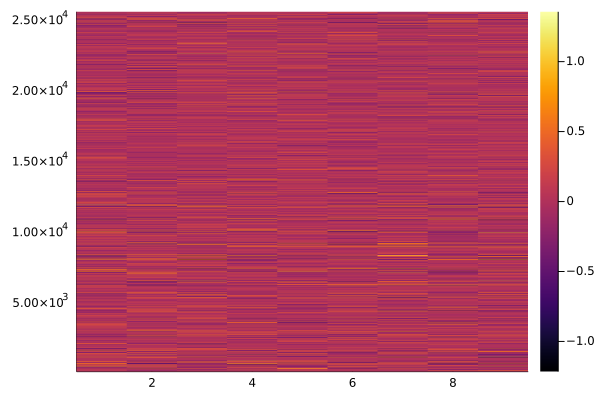

In [120]:
gr()
heatmap(subspace_model.A)

In [800]:
subspace_model.A

1238730×1 Matrix{Float64}:
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  ⋮
 -0.1255529336842937
  0.1272582951193362
 -0.20048623369685728
  0.1918036994725116
 -0.0966079750092656
  0.024084551789510154
  0.20027107033781996
 -0.02465052583926934
 -0.0714663372661274
  0.31913307752347014
 -0.400393052243087
  0.01453239088896498

In [121]:
gr()
mat = ps[1][clust_y.order, :]
anim = @animate for i = 1:output_size
    heatmap(rotr90(rotr90(rotr90(reshape(mat[i, :], (28, 28))))), clim=(-1, 1), title=i)
end
 

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_3Ka3Bc", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000023.png", "000024.png", "000025.png", "000026.png", "000027.png", "000028.png", "000029.png", "000030.png", "000031.png", "000032.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
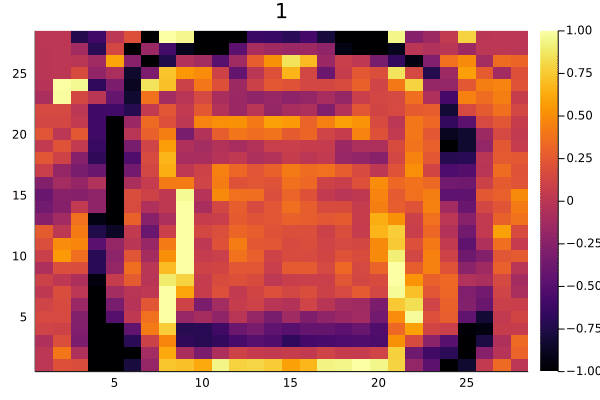

In [122]:
gif(anim, "tutorial_anim_fps30.gif", fps = 3)

In [244]:
gr()
mat = ps[1][clust_y.order, clust_x.order]
anim = @animate for i = 1:input_size
    heatmap(reshape(mat[:, i], (8, 8)), clim=(-.5, .5), title=i)
end
 

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_bDG4Uq", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000775.png", "000776.png", "000777.png", "000778.png", "000779.png", "000780.png", "000781.png", "000782.png", "000783.png", "000784.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
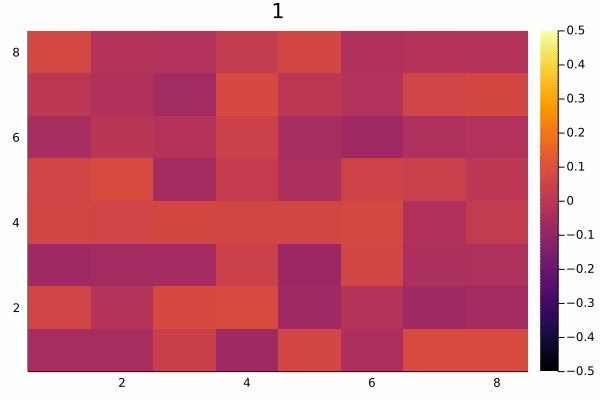

In [245]:
gif(anim, "tutorial_anim_fps30.gif", fps = 28)